# RINALMo novel structs analysis

In [6]:
import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# set current dir to the rinalmo path
project_path = 'DNALM_dependencies'
os.chdir(os.path.join(project_path, 'RiNALMo'))

In [2]:
import torch
from rinalmo.pretrained import get_pretrained_model

device = "cuda:0"


In [3]:

model, alphabet = get_pretrained_model(model_name="giga-v1")
model = model.to(device=device)
model.eval()
seqs = ["ACUUUGGCCA", "CCCGGU", "ACGU"]

tokens = torch.tensor(alphabet.batch_tokenize(seqs), dtype=torch.int64, device=device)

In [4]:
nuc_table = {"A" : 0, "C":1, "G":2, "U":3} # For RINALMo we have Us instead of Ts

def mutate_sequence(seq):
    seq = seq.upper()
    mutated_sequences = {'seq':[], 'mutation_pos':[], 'nuc':[], 'var_nt_idx':[]} #,'gene_id': []}
    #mutated_sequences['gene_id'].append(gene_id)
    mutated_sequences['seq'].append(seq)
    mutated_sequences['mutation_pos'].append(-1)
    mutated_sequences['nuc'].append('real sequence')
    mutated_sequences['var_nt_idx'].append(-1)


    mutate_until_position = len(seq)

    for i in range(mutate_until_position):
        for nuc in ['A', 'C', 'G', 'U']:
            if nuc != seq[i]:
                #mutated_sequences['gene_id'].append(gene_id)
                mutated_sequences['seq'].append(seq[:i] + nuc + seq[i+1:])
                mutated_sequences['mutation_pos'].append(i)
                mutated_sequences['nuc'].append(nuc)
                mutated_sequences['var_nt_idx'].append(nuc_table[nuc])

    mutations_df = pd.DataFrame(mutated_sequences)

    return mutations_df

In [5]:
import torch
from torch.utils.data import Dataset, DataLoader

class RNADataset(Dataset):
    def __init__(self, sequences):
        self.sequences = sequences

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return self.sequences[idx]

def custom_collate_fn(batch):

    # batch is a list of sequences
    tokenized_batch = torch.tensor(alphabet.batch_tokenize(batch), 
                                   dtype=torch.int64, 
                                   device=device)
    return tokenized_batch

batch_size = 64

def create_dataloader(dataset, batch_size=batch_size):
    rna_dataset = RNADataset(list(dataset['seq'].values))
    data_loader = DataLoader(rna_dataset, 
                            batch_size=batch_size, 
                            shuffle=False,
                            collate_fn=custom_collate_fn)
    return data_loader

In [7]:
acgu_idxs = [5, 6, 7, 8]
def model_inference(model, data_loader):

    print(f'Inferencing {len(data_loader)} batches')
    output_arrays = []
    for i, batch_tokens in enumerate(data_loader):
        # get some tokenized sequences (B, L_in)
        
        with torch.no_grad(), torch.cuda.amp.autocast():
            outputs = model(batch_tokens)['logits'].cpu().to(torch.float32)
        output_probs = torch.nn.functional.softmax(outputs, dim=-1)[:,:,acgu_idxs] # B, L_seq, 4
        output_arrays.append(output_probs) 

    print(f'Inferencing done')

    # rebuild to nseqs, L_seq, 4
    snp_reconstruct = torch.concat(output_arrays, axis=0)

    return snp_reconstruct.to(torch.float32).numpy()

In [8]:
def compute_ci_matrix(gene_seq,  get_logit=True, effect_on_ref_only = False):

    dataset = mutate_sequence(gene_seq) 
    data_loader = create_dataloader(dataset)
    snp_reconstruct = model_inference(model, data_loader)
    snp_reconstruct = snp_reconstruct[:,1:-1,:] # discard the beginning of sentence token and end of sentence token
    print(snp_reconstruct.shape)

    non_zero_log_value = 1e-10 #due to the conversion to bfloat16, we need to add a small value to avoid log(0)

    if get_logit: # for the logit add the small value and renormalize such that every prob in one position sums to 1
        snp_reconstruct = snp_reconstruct + non_zero_log_value
        snp_reconstruct = snp_reconstruct/snp_reconstruct.sum(axis=-1)[:,:, np.newaxis]

    seq_len = snp_reconstruct.shape[1]
    snp_effect = np.zeros((seq_len, seq_len,4, 4))
    reference_probs = snp_reconstruct[dataset[dataset['nuc'] == 'real sequence'].index[0]]

    print('shape of the reference probs:', reference_probs.shape)

    if get_logit:
        snp_effect[dataset.iloc[1:]['mutation_pos'].values, : ,  dataset.iloc[1:]['var_nt_idx'].values,:] = np.log2(snp_reconstruct[1:]) - np.log2(1 - snp_reconstruct[1:]) \
            - np.log2(reference_probs) + np.log2(1-reference_probs)
    else:
        snp_effect[dataset.iloc[1:]['mutation_pos'].values, : ,  dataset.iloc[1:]['var_nt_idx'].values,:] = np.log2(snp_reconstruct[1:]+non_zero_log_value) - np.log2(reference_probs+non_zero_log_value)

    if effect_on_ref_only:
        gene_seq_int = dataset.iloc[1:].groupby('mutation_pos').apply(lambda pos_df: (set(range(4)) - set(pos_df['var_nt_idx'])).pop()).values
        snp_effect_on_ref = snp_effect[:,np.arange(seq_len),:, gene_seq_int]
        ci_matrix = np.max(np.abs(snp_effect_on_ref), axis=2)

    else:
        ci_matrix = np.max(np.abs(snp_effect), axis=(2,3))

    return ci_matrix

def plot_ci_matrix(ci_matrix, vmax=None, figsize=[10, 10]):#increase figure size
    plt.rcParams['figure.figsize'] = figsize
    plt.imshow(ci_matrix, cmap="coolwarm", vmax=vmax) if vmax is not None else plt.imshow(ci_matrix, cmap="coolwarm")
    return plt

In [9]:
import pyranges as pr

gtf_file = os.path.join(os.path.join(data_path, 'GCF_000005845.2_ASM584v2_genomic.gtf'))
fasta_file = os.path.join(os.path.join(data_path, 'GCF_000005845.2_ASM584v2_genomic.fna'))

gtf_df = pr.read_gtf(gtf_file, full=False).df
gtf_df

,Chromosome,Start,End,Strand,Feature,gene_id,transcript_id,exon_number,exon_id
0,NC_000913.3,189,255,+,gene,b0001,; db_xref ASAP:ABE-0000006,NaN,NaN
1,NC_000913.3,189,252,+,CDS,b0001,gnl|b0001|mrna.NP_414542,1.0,NaN
2,NC_000913.3,189,192,+,start_codon,b0001,gnl|b0001|mrna.NP_414542,1.0,NaN
3,NC_000913.3,252,255,+,stop_codon,b0001,gnl|b0001|mrna.NP_414542,1.0,NaN
4,NC_000913.3,336,2799,+,gene,b0002,; db_xref ASAP:ABE-0000008,NaN,NaN
...,...,...,...,...,...,...,...,...,...
18015,NC_000913.3,4634440,4634443,-,stop_codon,b4396,gnl|b4396|mrna.NP_418813,1.0,NaN
18016,NC_000913.3,4639589,4640306,-,gene,b4401,; db_xref ASAP:ABE-0014434,NaN,NaN
18017,NC_000913.3,4639592,4640306,-,CDS,b4401,gnl|b4401|mrna.NP_418818,1.0,NaN
18018,NC_000913.3,4640303,4640306,-,start_codon,b4401,gnl|b4401|mrna.NP_418818,1.0,NaN


In [10]:
#fetch 500bp before each start codon
n_bp = 500
gtf_start_df = gtf_df[gtf_df['Feature'] == 'start_codon'].copy()
gtf_start_df['Start'] = gtf_df.apply(lambda x: x['Start'] - n_bp if x['Strand'] == '+' else x['Start'], axis=1)
gtf_start_df['End'] = gtf_df.apply(lambda x: x['End'] + n_bp if x['Strand'] == '-' else x['End'], axis=1)
gtf_start_pr = pr.PyRanges(gtf_start_df)
gtf_start_pr.seq = pr.get_sequence(gtf_start_pr, fasta_file)
gtf_start_df = gtf_start_pr.df
gtf_start_df

,Chromosome,Start,End,Strand,Feature,gene_id,transcript_id,exon_number,exon_id,seq
0,NC_000913.3,-311,192,+,start_codon,b0001,gnl|b0001|mrna.NP_414542,1.0,NaN,
1,NC_000913.3,-164,339,+,start_codon,b0002,gnl|b0002|mrna.NP_414543,1.0,NaN,
2,NC_000913.3,2300,2803,+,start_codon,b0003,gnl|b0003|mrna.NP_414544,1.0,NaN,GGCGACCACGCTGGCGCGGGAAATGGGTTATACCGAACCGGACCCG...
3,NC_000913.3,3233,3736,+,start_codon,b0004,gnl|b0004|mrna.NP_414545,1.0,NaN,CGTGTTTTCTCGGTGGTATGCAGTTGATGATCGAAGAAAACGACAT...
4,NC_000913.3,4733,5236,+,start_codon,b0005,gnl|b0005|mrna.NP_414546,1.0,NaN,AAACCACGCAACAGACAATGCGTGAGTTAAAAGAACTGGGCTACAC...
...,...,...,...,...,...,...,...,...,...,...
4310,NC_000913.3,4624786,4625289,-,start_codon,b4387,gnl|b4387|mrna.NP_418804,1.0,NaN,TTGGCAATTTCATCAATACATTCAATCTGGATGGCGGTGGAGTCCA...
4311,NC_000913.3,4630519,4631022,-,start_codon,b4391,gnl|b4391|mrna.NP_418808,1.0,NaN,GGAGGAAGCGTGGGGTTAGCGCGAACAAAGTTAGTGACCGTCACCG...
4312,NC_000913.3,4633742,4634245,-,start_codon,b4394,gnl|b4394|mrna.NP_418811,1.0,NaN,TGACTCACCAGCAGCGGTCGGCTTCCCTGCGGTAAGTCCCGGCAAG...
4313,NC_000913.3,4635307,4635810,-,start_codon,b4396,gnl|b4396|mrna.NP_418813,1.0,NaN,CCGTTTTTAATACGATCCGACAGTTCAATCGGCCCGACTTGCTGAC...


In [11]:
genes_of_interest = {
'b3966':500,
'b2349':200,
'b2775':300,
'b2599':500,
'b3136':300,
'b0028': 200,
'b3600': 200,
'b0281':200,
'b0611':200,
'b3088':200,
'b4037':200,
'b1050':200,
'b0680':200,
'b4180':200,
'b1635':100,
'b3190':100,
'b2265':100,
'b3088':100,
'b2774':100}

In [12]:
genes_window_df = pd.DataFrame(genes_of_interest.items(), columns=['gene_id', 'window_size'])
genes_window_df

,gene_id,window_size
0,b3966,500
1,b2349,200
2,b2775,300
3,b2599,500
4,b3136,300
5,b0028,200
6,b3600,200
7,b0281,200
8,b0611,200
9,b3088,100


In [13]:
gtf_genes_interest_df = gtf_start_df.merge(genes_window_df, on='gene_id', how='inner')
gtf_genes_interest_df

,Chromosome,Start,End,Strand,Feature,gene_id,transcript_id,exon_number,exon_id,seq,window_size
0,NC_000913.3,25325,25828,+,start_codon,b0028,gnl|b0028|mrna.NP_414569,1.0,NaN,CCCGCTGTTCCCGTCGCTTAATCTGCATTATGCGCGTAACTATGGC...,200
1,NC_000913.3,705592,706095,+,start_codon,b0680,gnl|b0680|mrna.NP_415206,1.0,NaN,CAACACCAACCACGCGTTCTGCCTGGAAACCGAAAAAGGCGCGGAG...,200
2,NC_000913.3,1113078,1113581,+,start_codon,b1050,gnl|b1050|mrna.NP_415568,1.0,NaN,TCAACGCTCCCTTGATGATGGCTTTATGCACGCAGTGTTTAACCCG...,200
3,NC_000913.3,1713876,1714379,+,start_codon,b1635,gnl|b1635|mrna.NP_416152,1.0,NaN,GTGCGAAATTCGCGTCTGACGCTGGTATCGTGTCTGTAAGCTGGCT...,100
4,NC_000913.3,2466044,2466547,+,start_codon,b2349,gnl|b2349|mrna.NP_416850,1.0,NaN,TGGAGCGATTTCATCTGGCCCTTCGCACTACCTACTTTAGCGGGGA...,200
5,NC_000913.3,2737244,2737747,+,start_codon,b2599,gnl|b2599|mrna.NP_417090,1.0,NaN,AAACACATCTGATTAATCCACATATCATTCTGTCCAAAGAGCCACA...,500
6,NC_000913.3,2900091,2900594,+,start_codon,b2775,gnl|b2775|mrna.NP_417255,1.0,NaN,ATCATTTCCTTTGTTTCGCCGTTATCTTTGACGAAACTAGGAATAA...,300
7,NC_000913.3,3238079,3238582,+,start_codon,b3088,gnl|b3088|mrna.YP_026201,1.0,NaN,AAGTGTGCTTCGTGCCGCGTGGCAGCCAAATGCAGGATCTCACCCA...,100
8,NC_000913.3,3281475,3281978,+,start_codon,b3136,gnl|b3136|mrna.NP_417605,1.0,NaN,CATATGGCGTCGCTGCATCCGGCGCGAATGCTGGGTGTTGATGGTG...,300
9,NC_000913.3,3773923,3774426,+,start_codon,b3600,gnl|b3600|mrna.NP_418057,1.0,NaN,GTCTATCGCGGTGCCACACGGTACGGTTGAAGCGAAAGATCGCGTA...,200


In [14]:
gtf_genes_interest_pr = pr.PyRanges(gtf_genes_interest_df)

In [15]:
gtf_genes_interest_pr.seq = pr.get_sequence(gtf_genes_interest_pr, path=fasta_file)
gtf_genes_interest_pr

,Chromosome,Start,End,Strand,Feature,gene_id,transcript_id,exon_number,exon_id,seq,window_size
0,NC_000913.3,25325,25828,+,start_codon,b0028,gnl|b0028|mrna.NP_414569,1.0,NaN,CCCGCTGTTCCCGTCGCTTAATCTGCATTATGCGCGTAACTATGGC...,200
1,NC_000913.3,705592,706095,+,start_codon,b0680,gnl|b0680|mrna.NP_415206,1.0,NaN,CAACACCAACCACGCGTTCTGCCTGGAAACCGAAAAAGGCGCGGAG...,200
2,NC_000913.3,1113078,1113581,+,start_codon,b1050,gnl|b1050|mrna.NP_415568,1.0,NaN,TCAACGCTCCCTTGATGATGGCTTTATGCACGCAGTGTTTAACCCG...,200
3,NC_000913.3,1713876,1714379,+,start_codon,b1635,gnl|b1635|mrna.NP_416152,1.0,NaN,GTGCGAAATTCGCGTCTGACGCTGGTATCGTGTCTGTAAGCTGGCT...,100
4,NC_000913.3,2466044,2466547,+,start_codon,b2349,gnl|b2349|mrna.NP_416850,1.0,NaN,TGGAGCGATTTCATCTGGCCCTTCGCACTACCTACTTTAGCGGGGA...,200
5,NC_000913.3,2737244,2737747,+,start_codon,b2599,gnl|b2599|mrna.NP_417090,1.0,NaN,AAACACATCTGATTAATCCACATATCATTCTGTCCAAAGAGCCACA...,500
6,NC_000913.3,2900091,2900594,+,start_codon,b2775,gnl|b2775|mrna.NP_417255,1.0,NaN,ATCATTTCCTTTGTTTCGCCGTTATCTTTGACGAAACTAGGAATAA...,300
7,NC_000913.3,3238079,3238582,+,start_codon,b3088,gnl|b3088|mrna.YP_026201,1.0,NaN,AAGTGTGCTTCGTGCCGCGTGGCAGCCAAATGCAGGATCTCACCCA...,100
8,NC_000913.3,3281475,3281978,+,start_codon,b3136,gnl|b3136|mrna.NP_417605,1.0,NaN,CATATGGCGTCGCTGCATCCGGCGCGAATGCTGGGTGTTGATGGTG...,300
9,NC_000913.3,3773923,3774426,+,start_codon,b3600,gnl|b3600|mrna.NP_418057,1.0,NaN,GTCTATCGCGGTGCCACACGGTACGGTTGAAGCGAAAGATCGCGTA...,200


In [16]:
gtf_genes_interest_df = gtf_genes_interest_pr.df
gtf_genes_interest_df['seq'] = gtf_genes_interest_df['seq'].str.upper()
gtf_genes_interest_df['seq'] = gtf_genes_interest_df.apply(lambda x: x['seq'][-x['window_size']:], axis=1)

In [20]:
import seaborn as sns
#plot_size = 50
#na_seq = RNA
tick_label_fontsize = 4

def plot_w_seq(ci_matrix, dna_seq, plot_size = 10, tick_label_fontsize = 4, filename=None, savefig=False, dpi=300, vmax=5):
    print(f"Sequence length: {len(dna_seq)}")
    plt.figure(figsize=(plot_size, plot_size))
    sns.heatmap(ci_matrix, cmap='coolwarm', vmax=vmax,  cbar=False)

    plt.gca().set_aspect('equal')

    tick_positions = np.arange(len(dna_seq)) + 0.5
    plt.xticks(tick_positions, list(dna_seq), fontsize=tick_label_fontsize, rotation=0)
    plt.yticks(tick_positions, list(dna_seq), fontsize=tick_label_fontsize, rotation=0)

    if savefig:
        plt.savefig(filename, dpi=dpi, bbox_inches='tight')

    plt.show()

### Get probs

In [21]:
# get a df with 'gene_id': [], 'seq':[], 'mask_pos':[] by masking each position in the gene_seq. 
#'seq' will contain the sequence with the masked position, 'mask_pos' will contain the position of the masked nucleotide

mask_token = "<mask>"
def get_masked_sequence_df(seq):

    seq = seq.upper()
    seq = list(seq)
    masked_seq = []
    mask_pos = []

    #append ref sequence
    masked_seq.append(" ".join(seq))
    mask_pos.append(-1)

    for i in range(len(seq)):
        masked_seq.append(" ".join((seq[:i] + [mask_token] + seq[i+1:])))
        mask_pos.append(i)

    return pd.DataFrame({'seq': masked_seq, 'mask_pos': mask_pos})

In [22]:
acgu_idxs = [5, 6, 7, 8]
def model_inference_probs(seq, batch_size=32):

    tokens = torch.tensor(alphabet.batch_tokenize([seq]), dtype=torch.int64, device=device)
    tokens_mat = tokens.repeat(tokens.shape[1], 1)
    tokens_mat[range(1,tokens_mat.shape[1]-1), range(1,tokens_mat.shape[1]-1)] = alphabet.tkn_to_idx[mask_token] #fill diagonal except the start and stop tokens
    batches_tokens_mat = tokens_mat.split(batch_size)
    print(f'Inferencing {len(batches_tokens_mat)} batches')

    output_arrays = []
    for i, batch_tokens in enumerate(batches_tokens_mat):
        # get some tokenized sequences (B, L_in)
        
        with torch.no_grad(), torch.cuda.amp.autocast():
            outputs = model(batch_tokens)['logits'].cpu().to(torch.float32)

        output_probs = torch.nn.functional.softmax(outputs, dim=-1)[:,:,acgu_idxs] # B, L_seq, 4
        output_arrays.append(output_probs) 

    print(f'Inferencing done')

    # rebuild to nseqs, L_seq, 4
    snp_reconstruct = torch.concat(output_arrays, axis=0)
    snp_reconstruct = snp_reconstruct.to(torch.float32).numpy()
    
    return snp_reconstruct[range(1,tokens_mat.shape[1]-1), range(1,tokens_mat.shape[1]-1),:] # get probs for masked positions

In [23]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np


def ic_scale(pwm,background):
    odds_ratio = ((pwm+0.001)/(1.004))/(background[None,:])
    ic = ((np.log((pwm+0.001)/(1.004))/np.log(2))*pwm -\
            (np.log(background)*background/np.log(2))[None,:])
    return pwm*(np.sum(ic,axis=1)[:,None])


def plot_a(ax, base, left_edge, height, color):
    a_polygon_coords = [
        np.array([
           [0.0, 0.0],
           [0.5, 1.0],
           [0.5, 0.8],
           [0.2, 0.0],
        ]),
        np.array([
           [1.0, 0.0],
           [0.5, 1.0],
           [0.5, 0.8],
           [0.8, 0.0],
        ]),
        np.array([
           [0.225, 0.45],
           [0.775, 0.45],
           [0.85, 0.3],
           [0.15, 0.3],
        ])
    ]
    for polygon_coords in a_polygon_coords:
        ax.add_patch(
            matplotlib.patches.Polygon(
                (np.array([1,height])[None,:]*polygon_coords
                 + np.array([left_edge,base])[None,:]),
                facecolor=color, edgecolor=color))


def plot_c(ax, base, left_edge, height, color):
    ax.add_patch(matplotlib.patches.Ellipse(
        xy=[left_edge+0.65, base+0.5*height], width=1.3, height=height,
        facecolor=color, edgecolor=color))
    ax.add_patch(matplotlib.patches.Ellipse(
        xy=[left_edge+0.65, base+0.5*height], width=0.7*1.3, height=0.7*height,
        facecolor='white', edgecolor='white'))
    ax.add_patch(matplotlib.patches.Rectangle(
        xy=[left_edge+1, base], width=1.0, height=height,
        facecolor='white', edgecolor='white', fill=True))


def plot_g(ax, base, left_edge, height, color):
    ax.add_patch(matplotlib.patches.Ellipse(
        xy=[left_edge+0.65, base+0.5*height], width=1.3, height=height,
        facecolor=color, edgecolor=color))
    ax.add_patch(matplotlib.patches.Ellipse(
        xy=[left_edge+0.65, base+0.5*height], width=0.7*1.3, height=0.7*height,
        facecolor='white', edgecolor='white'))
    ax.add_patch(matplotlib.patches.Rectangle(
        xy=[left_edge+1, base], width=1.0, height=height,
        facecolor='white', edgecolor='white', fill=True))
    ax.add_patch(matplotlib.patches.Rectangle(
        xy=[left_edge+0.825, base+0.085*height],
        width=0.174, height=0.415*height,
        facecolor=color, edgecolor=color, fill=True))
    ax.add_patch(matplotlib.patches.Rectangle(
        xy=[left_edge+0.625, base+0.35*height],
        width=0.374, height=0.15*height,
        facecolor=color, edgecolor=color, fill=True))


def plot_t(ax, base, left_edge, height, color):
    ax.add_patch(
        matplotlib.patches.Rectangle(xy=[left_edge+0.4, base],
        width=0.2, height=height, facecolor=color, edgecolor=color, fill=True))
    ax.add_patch(
        matplotlib.patches.Rectangle(xy=[left_edge, base+0.8*height],
        width=1.0, height=0.2*height, facecolor=color,
        edgecolor=color, fill=True))

    
def plot_u(ax, base, left_edge, height, color):
    ax.add_patch(matplotlib.patches.Ellipse(
        xy=[left_edge+0.5, base+0.4*height], width=0.95, height=0.8*height,
        facecolor=color, edgecolor=color))
    ax.add_patch(matplotlib.patches.Rectangle(
        xy=[left_edge+0.025, base+0.4*height], width=0.95, height=0.6*height,
        facecolor=color, edgecolor=color, fill=True))
    ax.add_patch(matplotlib.patches.Ellipse(
        xy=[left_edge+0.5, base+0.4*height], width=0.6175, height=0.52*height,
        facecolor='white', edgecolor='white'))
    ax.add_patch(matplotlib.patches.Rectangle(
        xy=[left_edge+0.19125, base+0.4*height], width=0.6175, height=0.6*height,
        facecolor='white', edgecolor='white', fill=True))
    """ax.add_patch(matplotlib.patches.Ellipse(
        xy=[left_edge+0.65, base+0.5*height], width=0.7*1.3, height=0.7*height,
        facecolor='white', edgecolor='white'))
    ax.add_patch(matplotlib.patches.Rectangle(
        xy=[left_edge+1, base], width=1.0, height=height,
        facecolor='white', edgecolor='white', fill=True))"""
    

default_colors = {0:'green', 1:'blue', 2:'orange', 3:'red'}
dna_plot_funcs = {0:plot_a, 1:plot_c, 2:plot_g, 3:plot_t}
rna_plot_funcs = {0:plot_a, 1:plot_c, 2:plot_g, 3:plot_u}


def plot_weights_given_ax(ax, array,          
                 height_padding_factor=0.2,
                 length_padding=1.0,
                 subticks_frequency="auto",
                 colors=default_colors,
                 plot_funcs=dna_plot_funcs,
                 highlight={},
                 ylabel=""):
    if len(array.shape)==3:
        array = np.squeeze(array)
    assert len(array.shape)==2, array.shape
    if (array.shape[0]==4 and array.shape[1] != 4):
        array = array.transpose(1,0)
    assert array.shape[1]==4
    if (subticks_frequency=="auto"):
        subticks_frequency = 1.0 if len(array) <= 40 else int(len(array)/40)
    max_pos_height = 0.0
    min_neg_height = 0.0
    heights_at_positions = []
    depths_at_positions = []
    for i in range(array.shape[0]):
        #sort from smallest to highest magnitude
        acgt_vals = sorted(enumerate(array[i,:]), key=lambda x: abs(x[1]))
        positive_height_so_far = 0.0
        negative_height_so_far = 0.0
        for letter in acgt_vals:
            plot_func = plot_funcs[letter[0]]
            color=colors[letter[0]]
            if (letter[1] > 0):
                height_so_far = positive_height_so_far
                positive_height_so_far += letter[1]                
            else:
                height_so_far = negative_height_so_far
                negative_height_so_far += letter[1]
            plot_func(ax=ax, base=height_so_far,
                      left_edge=i+0.5, height=letter[1], color=color)
        max_pos_height = max(max_pos_height, positive_height_so_far)
        min_neg_height = min(min_neg_height, negative_height_so_far)
        heights_at_positions.append(positive_height_so_far)
        depths_at_positions.append(negative_height_so_far)

    #now highlight any desired positions; the key of
    #the highlight dict should be the color
    for color in highlight:
        for start_pos, end_pos in highlight[color]:
            assert start_pos >= 0.0 and end_pos <= array.shape[0]
            min_depth = np.min(depths_at_positions[start_pos:end_pos])
            max_height = np.max(heights_at_positions[start_pos:end_pos])
            ax.add_patch(
                matplotlib.patches.Rectangle(xy=[start_pos,min_depth],
                    width=end_pos-start_pos,
                    height=max_height-min_depth,
                    edgecolor=color, fill=False))
            
    ax.set_xlim(0.5-length_padding, 0.5+array.shape[0]+length_padding)
    ax.xaxis.set_ticks(np.arange(1.0, array.shape[0]+1, subticks_frequency))
    height_padding = max(abs(min_neg_height)*(height_padding_factor),
                         abs(max_pos_height)*(height_padding_factor))
    ax.set_ylim(min_neg_height-height_padding, max_pos_height+height_padding)
    ax.set_ylabel(ylabel)
    ax.yaxis.label.set_fontsize(15)


def plot_weights(array,
                 figsize=(20,2),
                 ax_transform_func=lambda x: x,
                 **kwargs):
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111) 
    ax_transform_func(ax)
    plot_weights_given_ax(ax=ax,
        array=array,
        **kwargs)
    plt.show()
    
    
def dna_plot_weights(array, **kwargs):
  plot_weights(array=array, plot_funcs=dna_plot_funcs, **kwargs)


def rna_plot_weights(array, **kwargs):
  plot_weights(array=array, plot_funcs=rna_plot_funcs, **kwargs)

In [24]:
def compute_log_ratio(nuc_probs):
    nucs_mean = nuc_probs[:-3].mean(axis = 0)
    nucs_normed = nuc_probs * np.log2(nuc_probs/nucs_mean)
    return nucs_normed

In [28]:
import matplotlib.gridspec as gridspec
def combined_plot(probs, ci_matrix, sequence, figsize=(15, 16), tick_label_fontsize=10, vmax=10, savefig=False, filename=None, dpi=300, show_plot=True):
    # Set up the figure and subplots
    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(2, 1, height_ratios=[12, 1])  # Adjust height ratios based on visual needs

    # First subplot for the matrix
    ax1 = fig.add_subplot(gs[0])
    sns.heatmap(ci_matrix, cmap='coolwarm', vmax=vmax, cbar=False, ax=ax1)
    seq_len = len(sequence)
    ax1.set_xlim(0, seq_len)

    # Second subplot for the sequence weights
    ax2 = fig.add_subplot(gs[1], sharex=ax1)
    plot_weights_given_ax(ax=ax2, array=compute_log_ratio(probs), subticks_frequency=1)
    ax2.set_xticks([])  # Hide x-tick labels on the sequence plot

    # Aligning ticks
    tick_positions = np.arange(seq_len) + 0.5
    ax1.set_xticks(tick_positions)
    ax1.set_xticklabels(list(sequence), fontsize=tick_label_fontsize, rotation=0)
    ax1.set_yticks(tick_positions)
    ax1.set_yticklabels(list(sequence), fontsize=tick_label_fontsize, rotation=0)

    plt.subplots_adjust(hspace=0)

    if savefig:
        plt.savefig(filename, dpi=dpi, bbox_inches='tight')

    if show_plot:
        plt.show()

b0028
Inferencing 11 batches
Inferencing done
(650, 200, 4)
shape of the reference probs: (200, 4)
Inferencing 2 batches
Inferencing done


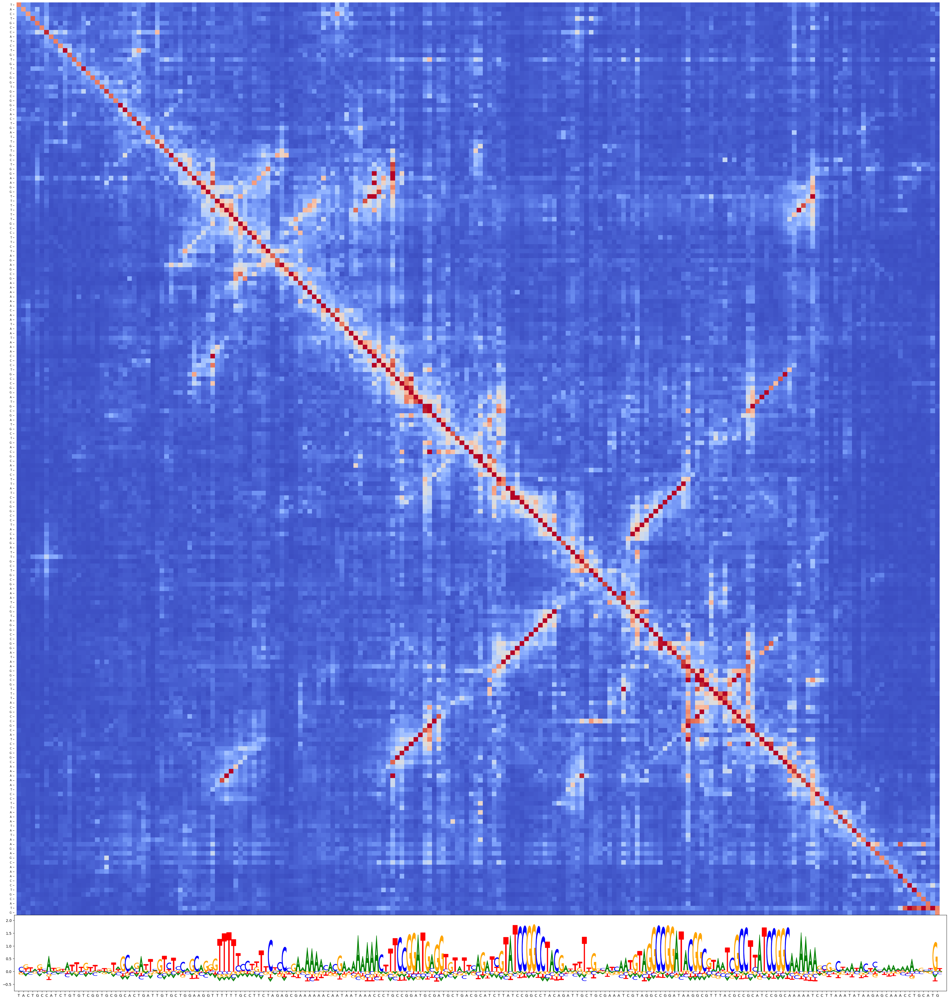

b0680
Inferencing 11 batches
Inferencing done
(667, 200, 4)
shape of the reference probs: (200, 4)
Inferencing 2 batches
Inferencing done


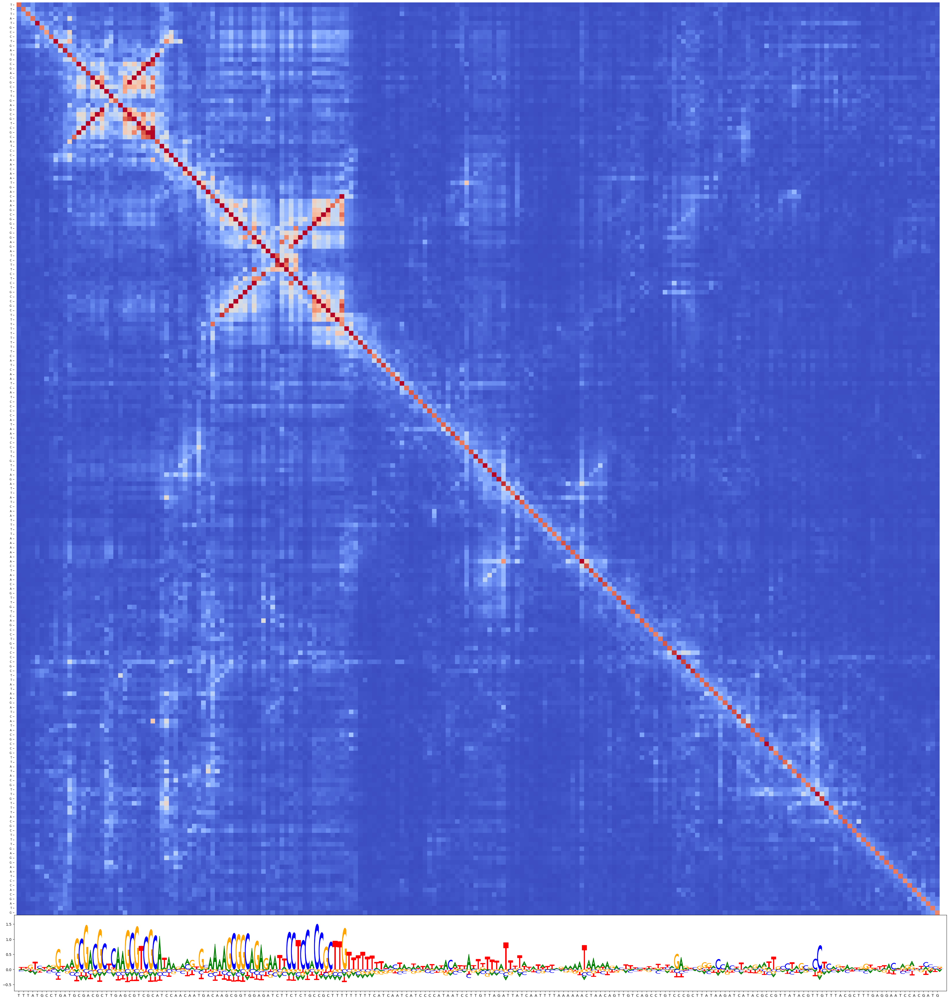

b1050
Inferencing 11 batches
Inferencing done
(654, 200, 4)
shape of the reference probs: (200, 4)
Inferencing 2 batches
Inferencing done


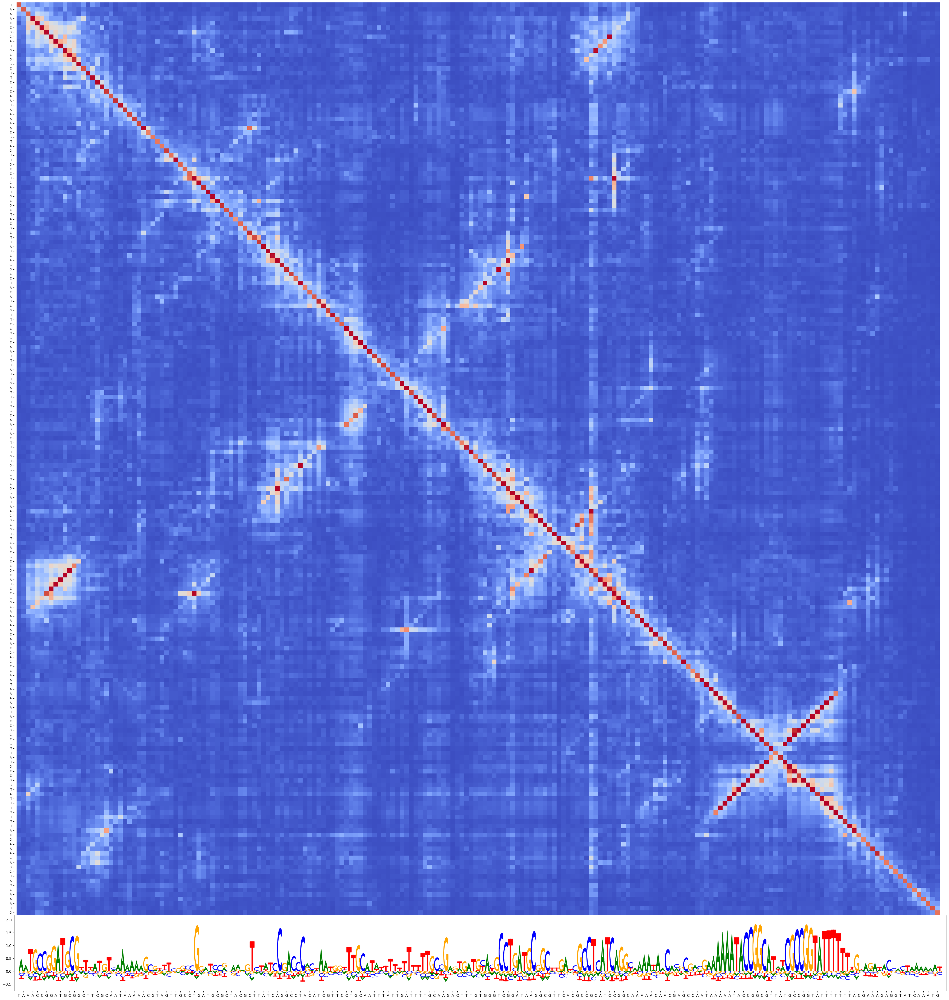

b1635
Inferencing 6 batches
Inferencing done
(332, 100, 4)
shape of the reference probs: (100, 4)
Inferencing 1 batches
Inferencing done


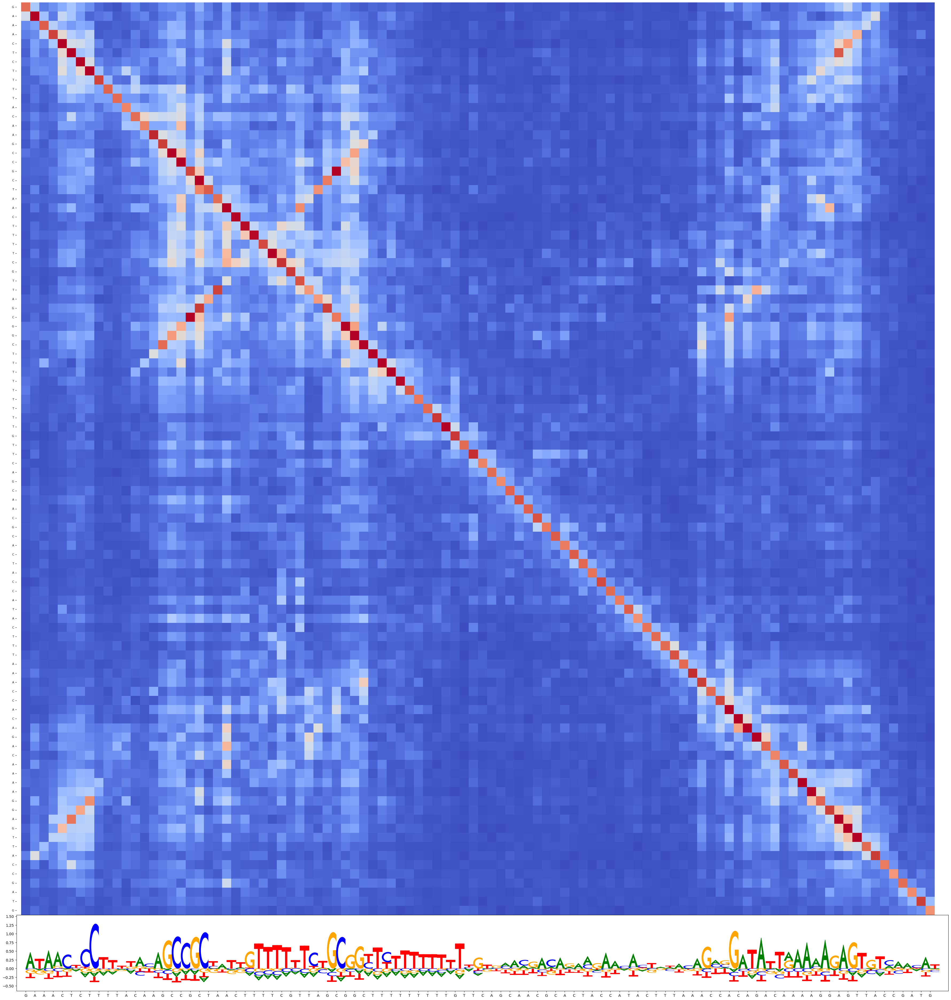

b2349
Inferencing 11 batches
Inferencing done
(656, 200, 4)
shape of the reference probs: (200, 4)
Inferencing 2 batches
Inferencing done


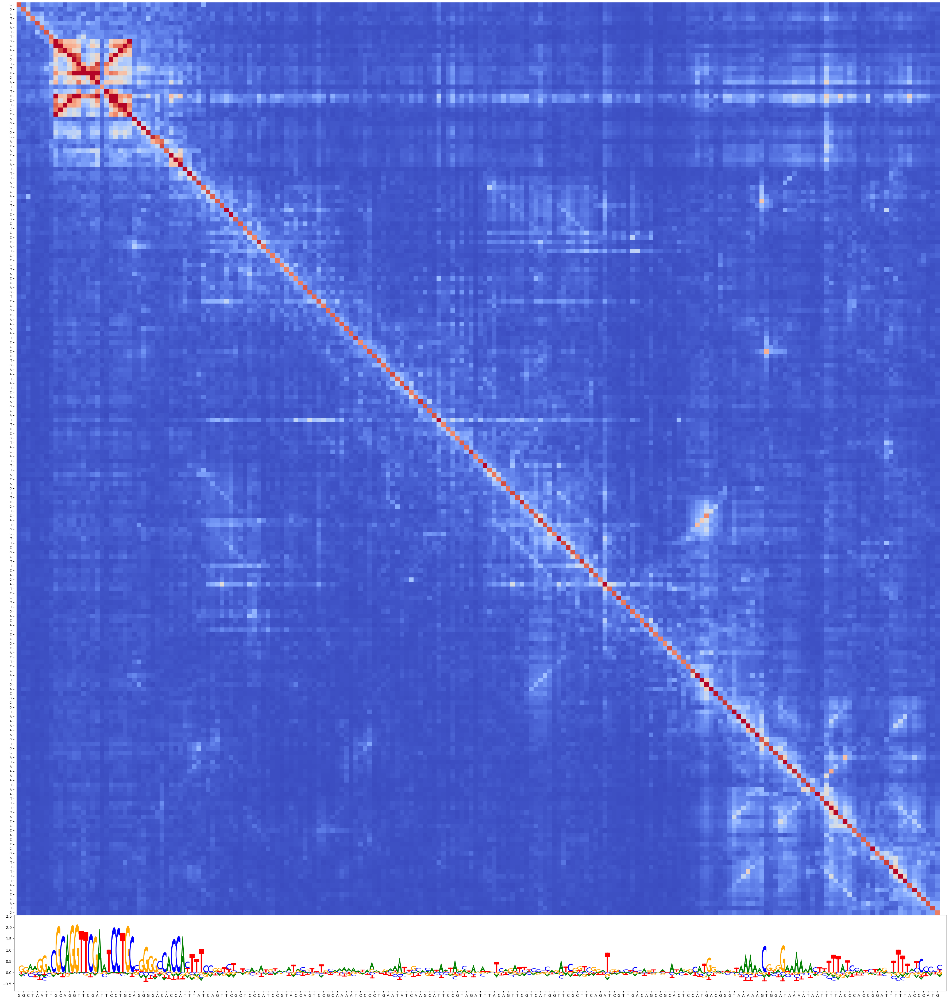

b2599
Inferencing 26 batches
Inferencing done
(1622, 500, 4)
shape of the reference probs: (500, 4)
Inferencing 4 batches
Inferencing done


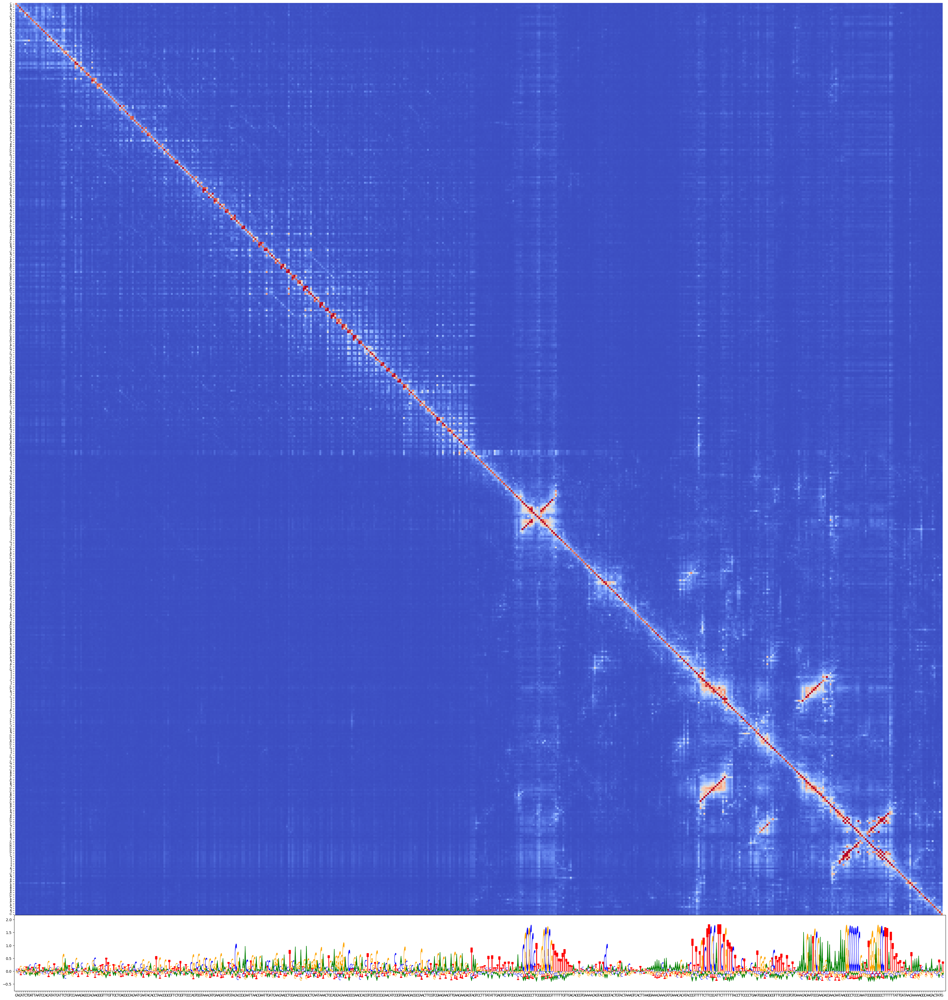

b2775
Inferencing 16 batches
Inferencing done
(997, 300, 4)
shape of the reference probs: (300, 4)
Inferencing 3 batches
Inferencing done


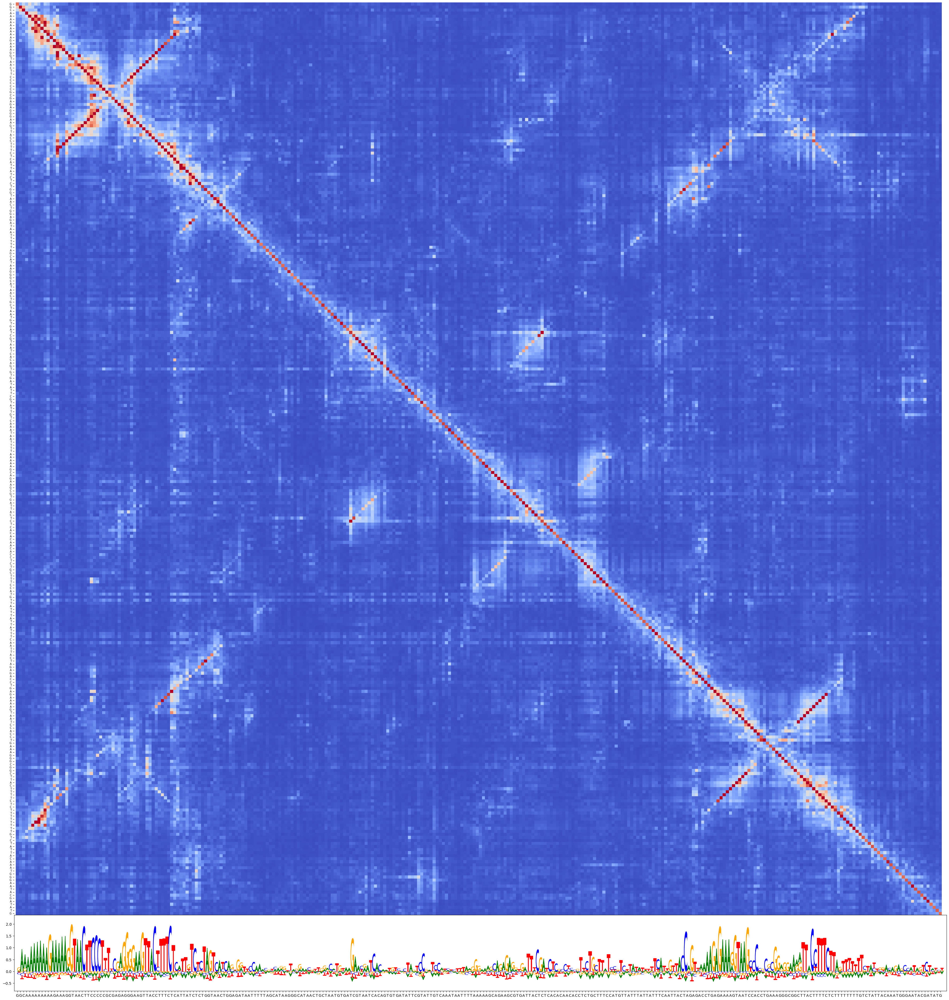

b3088
Inferencing 6 batches
Inferencing done
(330, 100, 4)
shape of the reference probs: (100, 4)
Inferencing 1 batches
Inferencing done


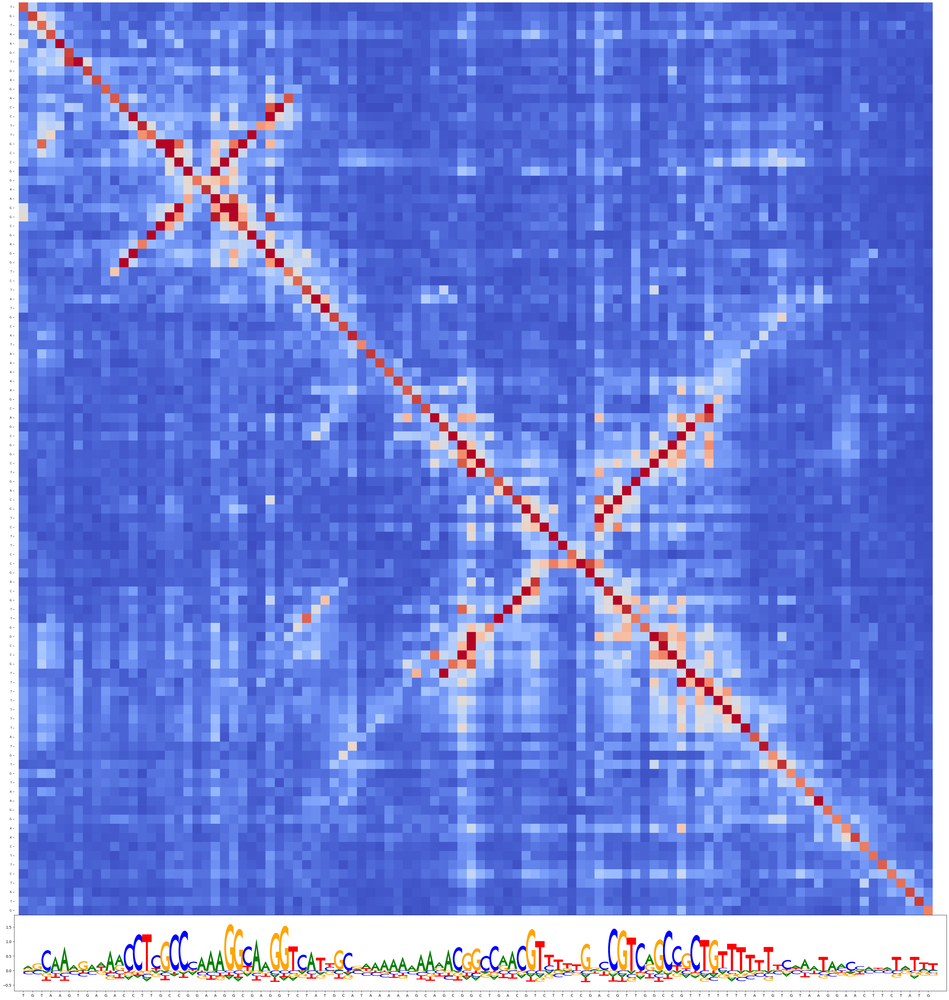

b3136
Inferencing 16 batches
Inferencing done
(996, 300, 4)
shape of the reference probs: (300, 4)
Inferencing 3 batches
Inferencing done


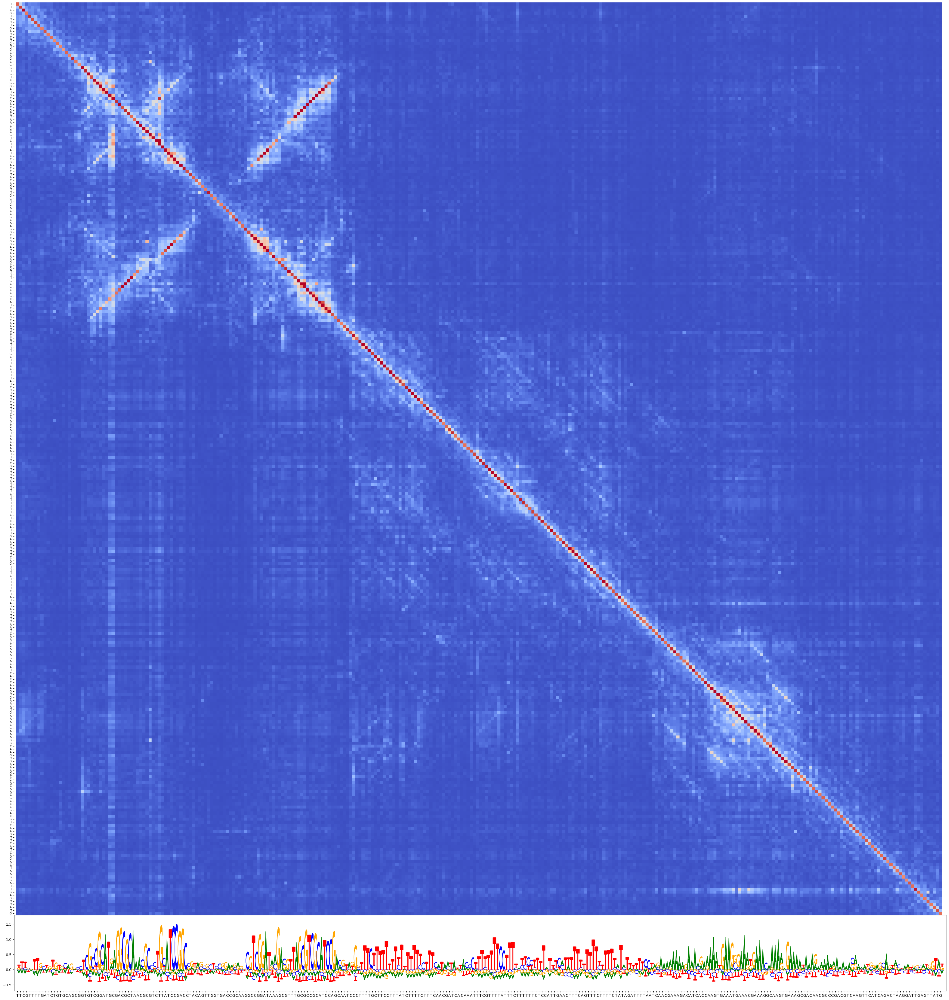

b3600
Inferencing 11 batches
Inferencing done
(651, 200, 4)
shape of the reference probs: (200, 4)
Inferencing 2 batches
Inferencing done


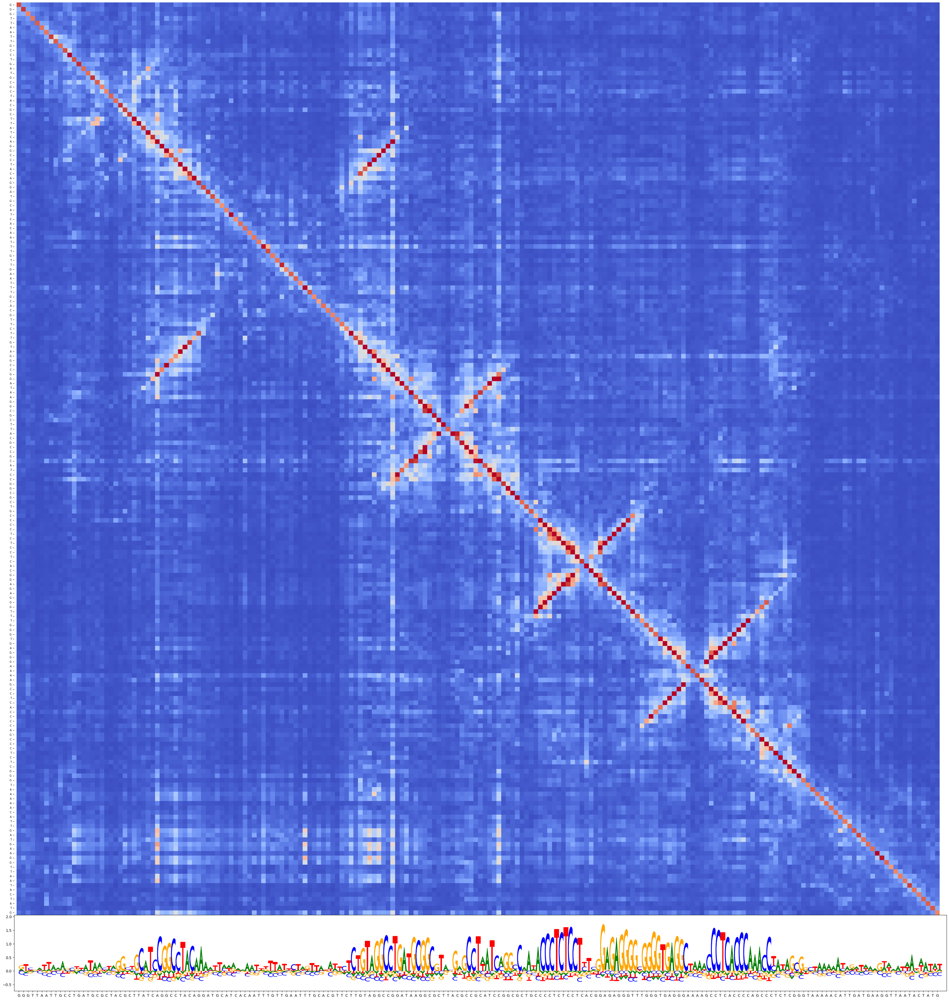

b3966
Inferencing 26 batches
Inferencing done
(1638, 500, 4)
shape of the reference probs: (500, 4)
Inferencing 4 batches
Inferencing done


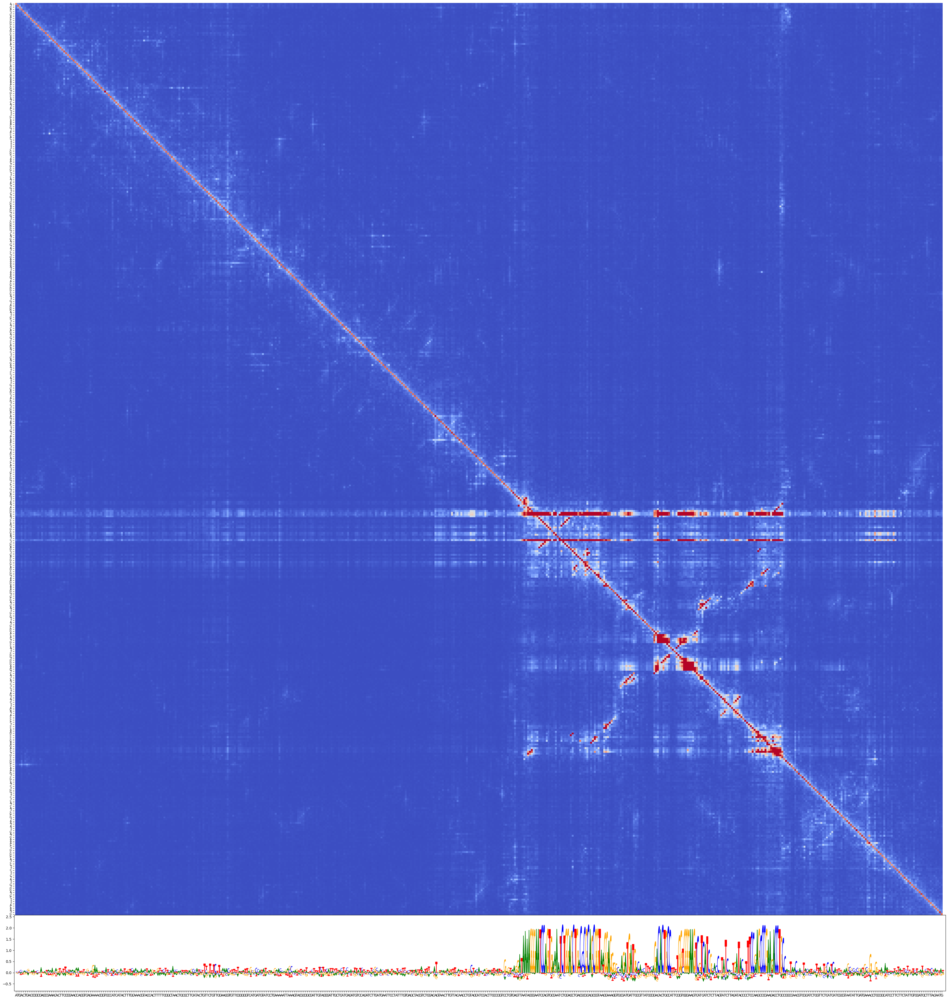

b4037
Inferencing 11 batches
Inferencing done
(648, 200, 4)
shape of the reference probs: (200, 4)
Inferencing 2 batches
Inferencing done


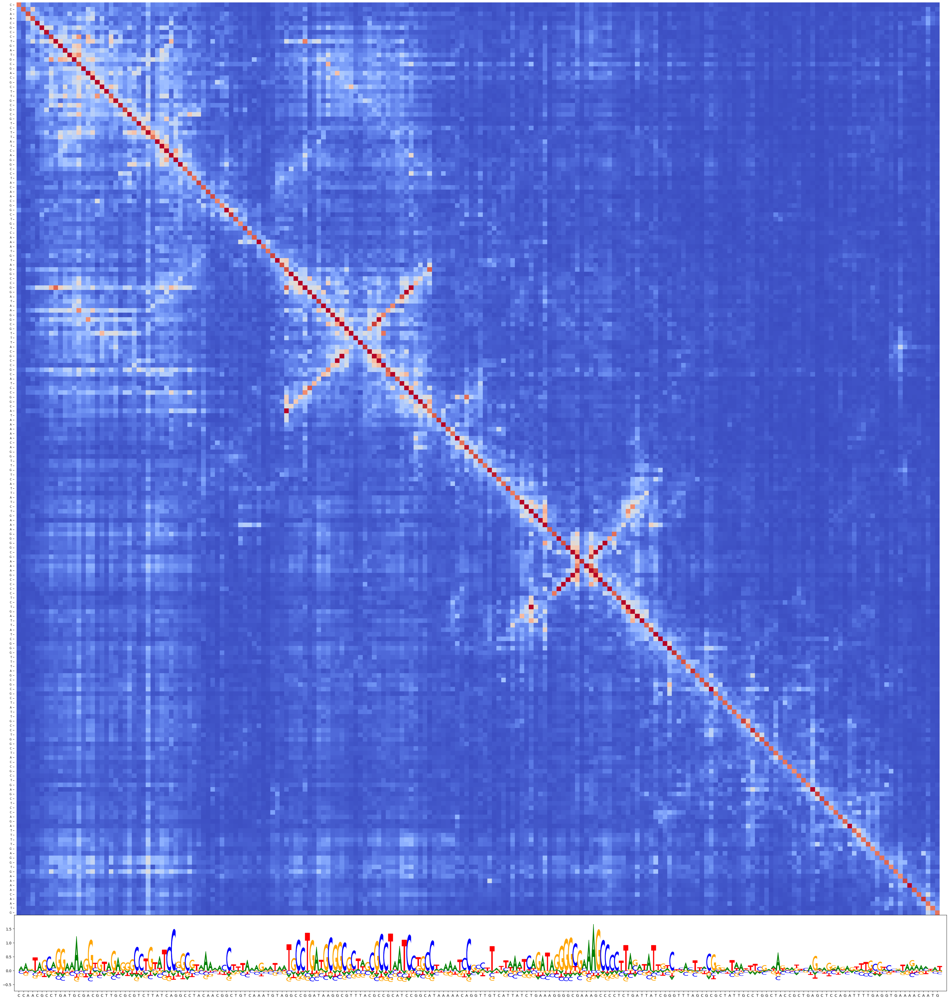

b4180
Inferencing 11 batches
Inferencing done
(647, 200, 4)
shape of the reference probs: (200, 4)
Inferencing 2 batches
Inferencing done


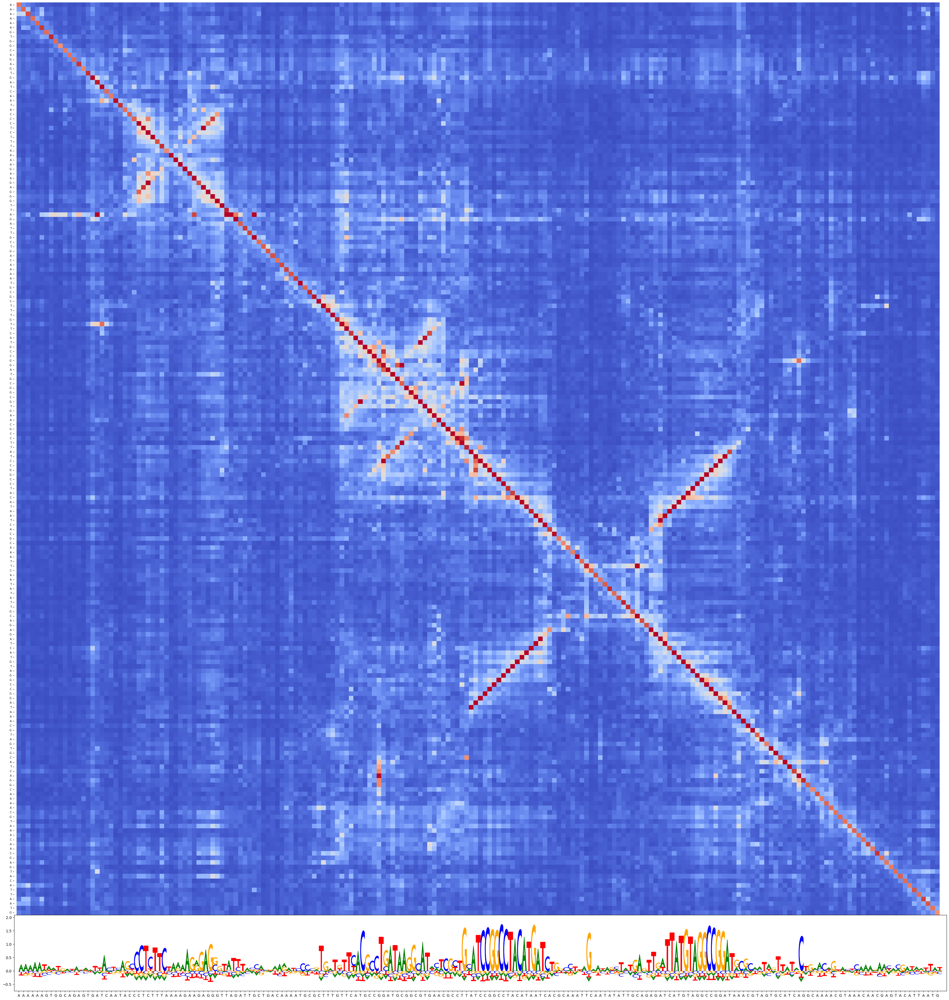

b0281
Inferencing 11 batches
Inferencing done
(664, 200, 4)
shape of the reference probs: (200, 4)
Inferencing 2 batches
Inferencing done


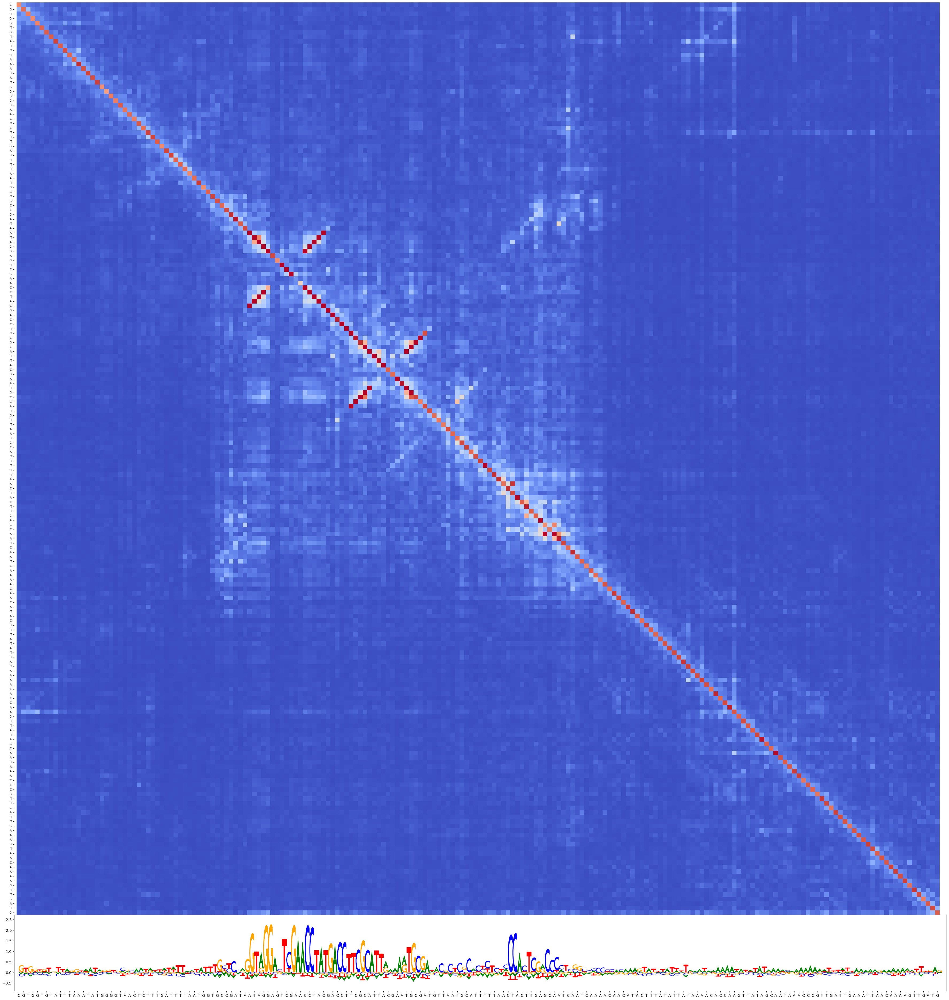

b0611
Inferencing 11 batches
Inferencing done
(664, 200, 4)
shape of the reference probs: (200, 4)
Inferencing 2 batches
Inferencing done


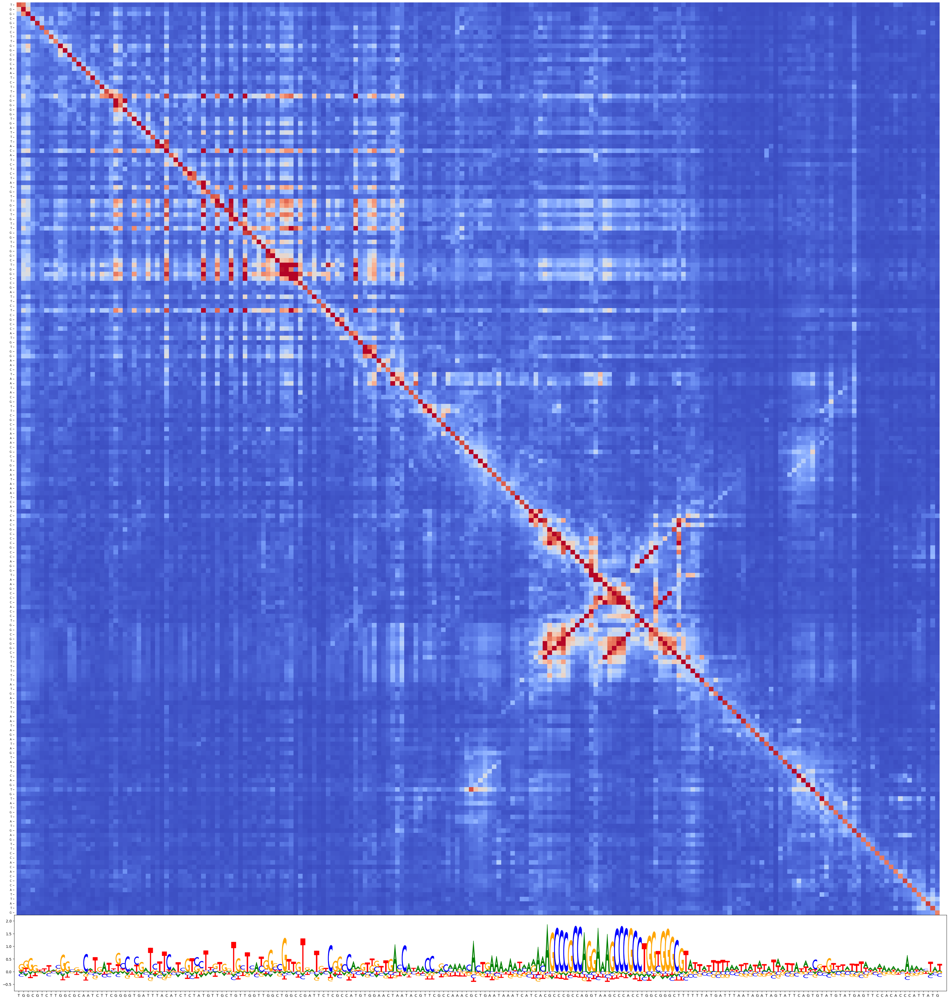

b2265
Inferencing 6 batches
Inferencing done
(330, 100, 4)
shape of the reference probs: (100, 4)
Inferencing 1 batches
Inferencing done


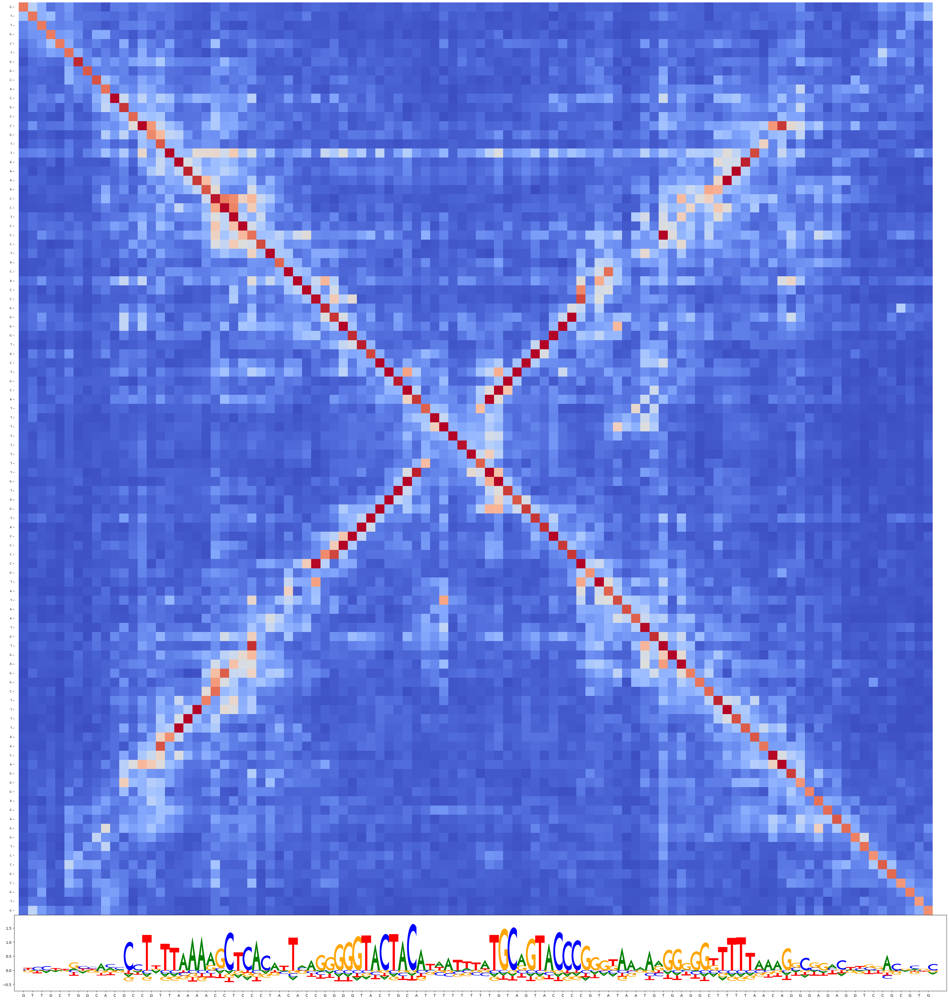

b2774
Inferencing 6 batches
Inferencing done
(335, 100, 4)
shape of the reference probs: (100, 4)
Inferencing 1 batches
Inferencing done


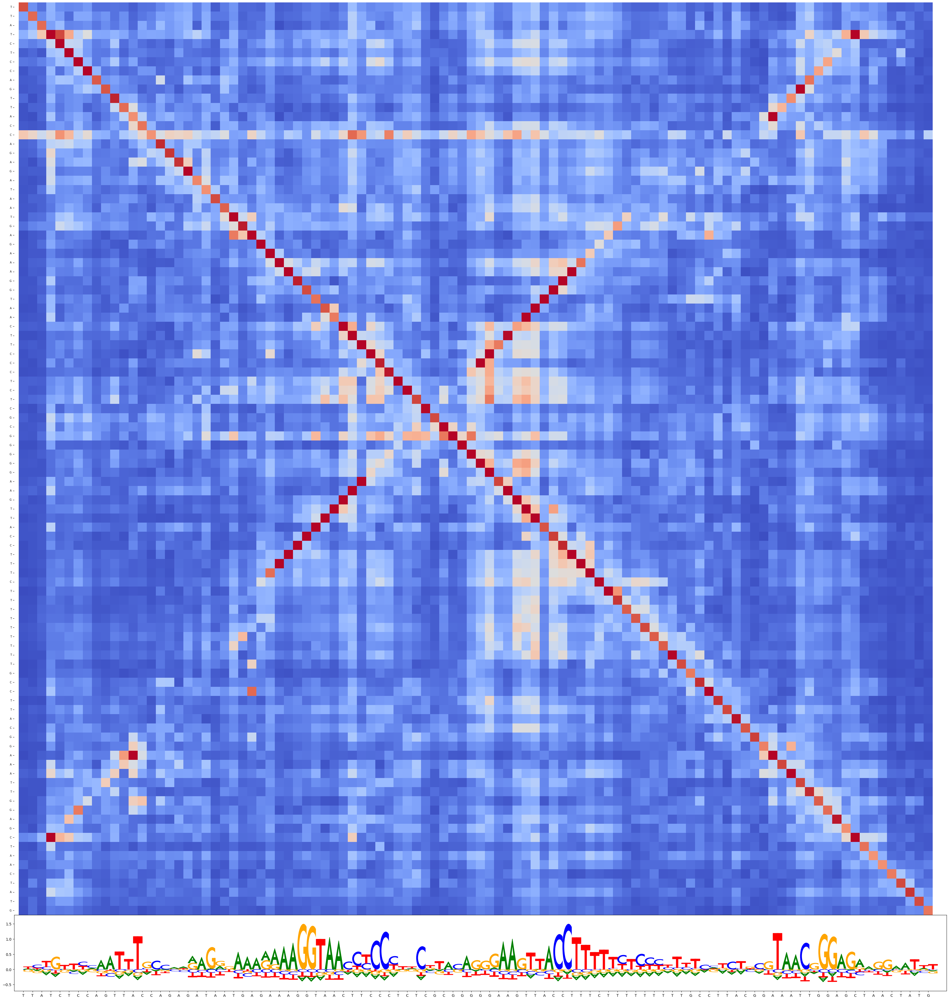

b3190
Inferencing 6 batches
Inferencing done
(341, 100, 4)
shape of the reference probs: (100, 4)
Inferencing 1 batches
Inferencing done


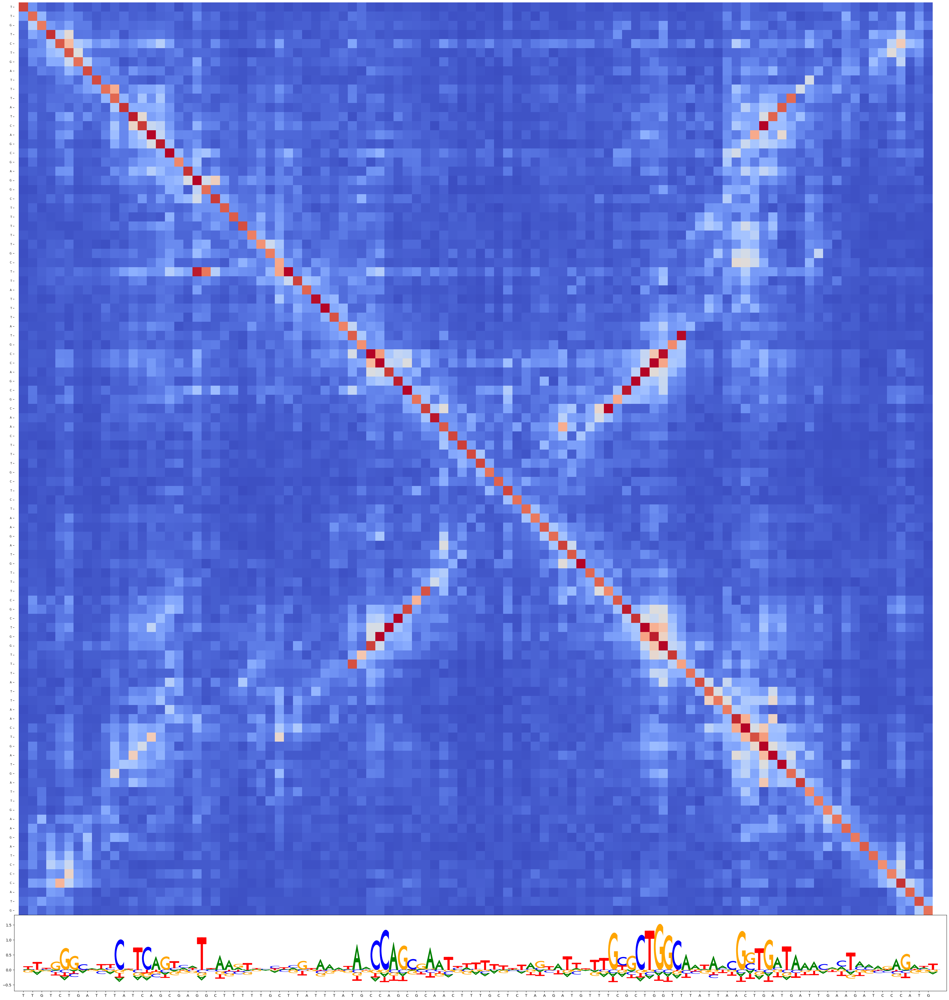

In [29]:
matrices_files_dict = {}

for i, row in gtf_genes_interest_df.iterrows():
    print(row['gene_id'])
    RNA = row['seq'].upper()

    # Set the parameters for chunking
    chunk_size = 1000
    overlap = 500

    if len(RNA) > chunk_size:
       
        num_chunks = (len(RNA) - overlap) // overlap + 1
        for i in range(num_chunks):
            print(f'chunk {i}')
            start_index = i * overlap
            end_index = start_index + chunk_size
            if end_index > len(RNA):
                end_index = len(RNA)
            RNA_chunk = RNA[start_index:end_index]

            filename = os.path.join(project_path, f"{row['gene_id']}_{start_index}_{start_index}_dependency_map_w_reconstruction.pdf")
            ci_matrix = compute_ci_matrix(RNA_chunk)
            
            matrices_files_dict[filename] = ci_matrix
            probs = model_inference_probs(RNA_chunk, batch_size=128)
            combined_plot(probs, ci_matrix, RNA_chunk, figsize=(45, 48), tick_label_fontsize=4, vmax=5, filename=filename, savefig=True, show_plot=True)
    else:
        # Process the whole sequence at once if it's shorter than the chunk size
        filename = os.path.join(project_path, f"{row['gene_id']}_dependency_map_w_reconstruction.pdf")
        ci_matrix = compute_ci_matrix(RNA)
        matrices_files_dict[filename] = ci_matrix
        
        probs = model_inference_probs(RNA, batch_size=128)
        combined_plot(probs, ci_matrix, RNA, figsize=(45, 48), tick_label_fontsize=7, vmax=5, filename=filename, savefig=True, show_plot=True)